<div style="display: flex; background-color: RGB(255,114,0); padding: 30px;" >

# MNIST 
</div>

Dans ce projet, nous utiliserons l'ensemble de données **MNIST**, qui est un ensemble de 70 000 petites images de chiffres écrits à la main par des lycéens et des employés du Bureau américain du recensement.        
Chaque image est étiquetée avec le chiffre qu'elle représente.    
Cet ensemble a été tellement étudié qu'il est souvent appelé le "hello world" de Apprentissage automatique : chaque fois que les gens proposent une nouvelle classification algorithme, ils sont curieux de voir comment il fonctionnera sur **MNIST**, et toute personne qui apprend l'apprentissage automatique s'attaque à cet ensemble de données tôt ou tard.   
**Scikit-Learn** fournit de nombreuses fonctions d'assistance pour télécharger des ensembles de données populaires.     
Le MNIST en fait partie. https://www.kaggle.com/c/digit-recognizer     
https://fr.wikipedia.org/wiki/Base_de_donn%C3%A9es_MNIST     


Avant de commancer le projet essayez de voir les cours et faire les travaux pratiques SVM.
http://cedric.cnam.fr/vertigo/cours/ml2/      

C'est un projet de classification, alors utiliser par exemple les modèles de Machine Learning de la librairie **scikit-learn** suivant: https://scikit-learn.org/stable/supervised_learning.html    

* LogisticRegression
* KNN
* SVC :
  * https://scikit-learn.org/stable/modules/svm.html#classification
  * http://cedric.cnam.fr/vertigo/cours/ml2/tpSVMLineaires.html
  * http://cedric.cnam.fr/vertigo/cours/ml2/tpMethodesNoyaux.html#machines-a-vecteurs-de-support-svm


Essayer de définir et comprendre les mots clefs de chaque algorithme

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from mnist_function import *
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import OneHotEncoder
import time
from collections import defaultdict

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 1.Chargement des données
</div>

In [3]:
mnist = fetch_openml('mnist_784', version=1)
mnist.keys()

dict_keys(['data', 'target', 'frame', 'categories', 'feature_names', 'target_names', 'DESCR', 'details', 'url'])

- La clé **DESCR** décrivant le jeu de données

- La clé **data** contenant un tableau avec une ligne par instance et une colonne par caractéristique

- La clé **target** contenant un tableau avec les étiquettes

<div style="display: flex; background-color: Blue; padding: 15px;" >

## 2.Exploration des données
</div>

Voir le site officiel : http://yann.lecun.com/exdb/mnist/

In [4]:
type(mnist)

sklearn.utils.Bunch

In [5]:
mnist.frame

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784,class
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
69996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
69997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4
69998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


In [6]:
mnist.frame.columns

Index(['pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5', 'pixel6', 'pixel7',
       'pixel8', 'pixel9', 'pixel10',
       ...
       'pixel776', 'pixel777', 'pixel778', 'pixel779', 'pixel780', 'pixel781',
       'pixel782', 'pixel783', 'pixel784', 'class'],
      dtype='object', length=785)

In [7]:
# Target = class
mnist.frame['class']

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']

In [8]:
mnist.feature_names

['pixel1',
 'pixel2',
 'pixel3',
 'pixel4',
 'pixel5',
 'pixel6',
 'pixel7',
 'pixel8',
 'pixel9',
 'pixel10',
 'pixel11',
 'pixel12',
 'pixel13',
 'pixel14',
 'pixel15',
 'pixel16',
 'pixel17',
 'pixel18',
 'pixel19',
 'pixel20',
 'pixel21',
 'pixel22',
 'pixel23',
 'pixel24',
 'pixel25',
 'pixel26',
 'pixel27',
 'pixel28',
 'pixel29',
 'pixel30',
 'pixel31',
 'pixel32',
 'pixel33',
 'pixel34',
 'pixel35',
 'pixel36',
 'pixel37',
 'pixel38',
 'pixel39',
 'pixel40',
 'pixel41',
 'pixel42',
 'pixel43',
 'pixel44',
 'pixel45',
 'pixel46',
 'pixel47',
 'pixel48',
 'pixel49',
 'pixel50',
 'pixel51',
 'pixel52',
 'pixel53',
 'pixel54',
 'pixel55',
 'pixel56',
 'pixel57',
 'pixel58',
 'pixel59',
 'pixel60',
 'pixel61',
 'pixel62',
 'pixel63',
 'pixel64',
 'pixel65',
 'pixel66',
 'pixel67',
 'pixel68',
 'pixel69',
 'pixel70',
 'pixel71',
 'pixel72',
 'pixel73',
 'pixel74',
 'pixel75',
 'pixel76',
 'pixel77',
 'pixel78',
 'pixel79',
 'pixel80',
 'pixel81',
 'pixel82',
 'pixel83',
 'pixel84',
 

<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.1. X et Y
</div>

In [9]:
X, y = mnist["data"], mnist["target"]

In [10]:
X.shape

(70000, 784)

In [11]:
y.shape

(70000,)

<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.3. Analyse si nettoyage ou non
</div>

In [12]:
print(f"X nan:{X.isna().sum().sum()} et Y nan:{y.isna().sum().sum()}")
X.describe(include="all")

X nan:0 et Y nan:0


,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,...,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.0,70000.0,70000.0,70000.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.197414,0.099543,0.046629,0.016614,0.012957,0.001714,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.991206,4.256304,2.783732,1.561822,1.553796,0.320889,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,254.000000,253.000000,253.000000,254.000000,62.000000,0.0,0.0,0.0,0.0


In [13]:
X.describe(include="all")

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
count,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,70000.0,...,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.0,70000.0,70000.0,70000.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.197414,0.099543,0.046629,0.016614,0.012957,0.001714,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.991206,4.256304,2.783732,1.561822,1.553796,0.320889,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,254.000000,254.000000,253.000000,253.000000,254.000000,62.000000,0.0,0.0,0.0,0.0


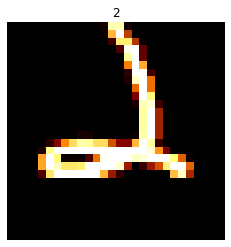

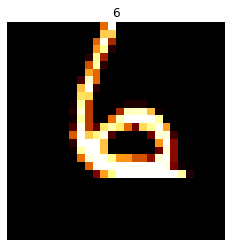

In [14]:
show_digit(X.values[12352], y[12352])
show_digit(X.values[12905], y[12905])

<div style="display: flex; background-color: indigo;" >

#### Conclusion
</div>

La suppression des pixels blancs en début et fin ne semble pas pertinente

<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.4. Typage / Encodage
</div>

**Notez que target est une chaîne. La plupart des algorithmes de ML attendent des chiffres, alors allons-y convertir y en entier :**

In [15]:
y = y.astype(np.uint8)

In [16]:
y

0        5
1        0
2        4
3        1
4        9
        ..
69995    2
69996    3
69997    4
69998    5
69999    6
Name: class, Length: 70000, dtype: uint8

In [17]:
encoder = OneHotEncoder(sparse=False)
transformed = encoder.fit_transform(pd.DataFrame(y))
print(transformed.shape)
transformed

(70000, 10)


array([[0., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [18]:
#Create a Pandas DataFrame of the hot encoded column
ohe_df = pd.DataFrame(transformed, columns=encoder.get_feature_names_out())
print("ohe_df:", ohe_df.shape, "y:", y.shape)

ohe_df: (70000, 10) y: (70000,)


In [19]:
#concat with original data
Y_df = pd.concat([y, ohe_df], axis=1)
print("ohe_df:", ohe_df.shape, "y:", y.shape, "data_encode:", Y_df.shape)
Y_df.head()

ohe_df: (70000, 10) y: (70000,) data_encode: (70000, 11)


,class,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9
0,5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


Mais attendez! Vous devez toujours créer une campagne de test et la mettre de côté avant d'inspecter les données de près. Le jeu de données **MNIST** est en fait déjà divisé en un ensemble d'apprentissage (les 60 000 premières images) et un ensemble de tests (les 10 000 dernières images):

In [20]:
X_train, X_test, Y_train, Y_test = X[:60000], X[60000:], Y_df[:60000], Y_df[60000:]
X_train.shape

(60000, 784)

In [21]:
Y_train

,class,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9
0,5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
59995,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
59996,3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
59997,5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
59998,6,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [22]:
Y_test

,class,class_0,class_1,class_2,class_3,class_4,class_5,class_6,class_7,class_8,class_9
60000,7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
60001,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60002,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60003,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
60004,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
69995,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
69996,3,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
69997,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
69998,5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


<div style="display: flex; background-color: Green; padding: 7px;" >

### 2.5. Visualisation
</div>

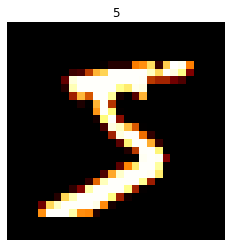

In [23]:
show_digit(X.values[0], y[0])
plt.show()

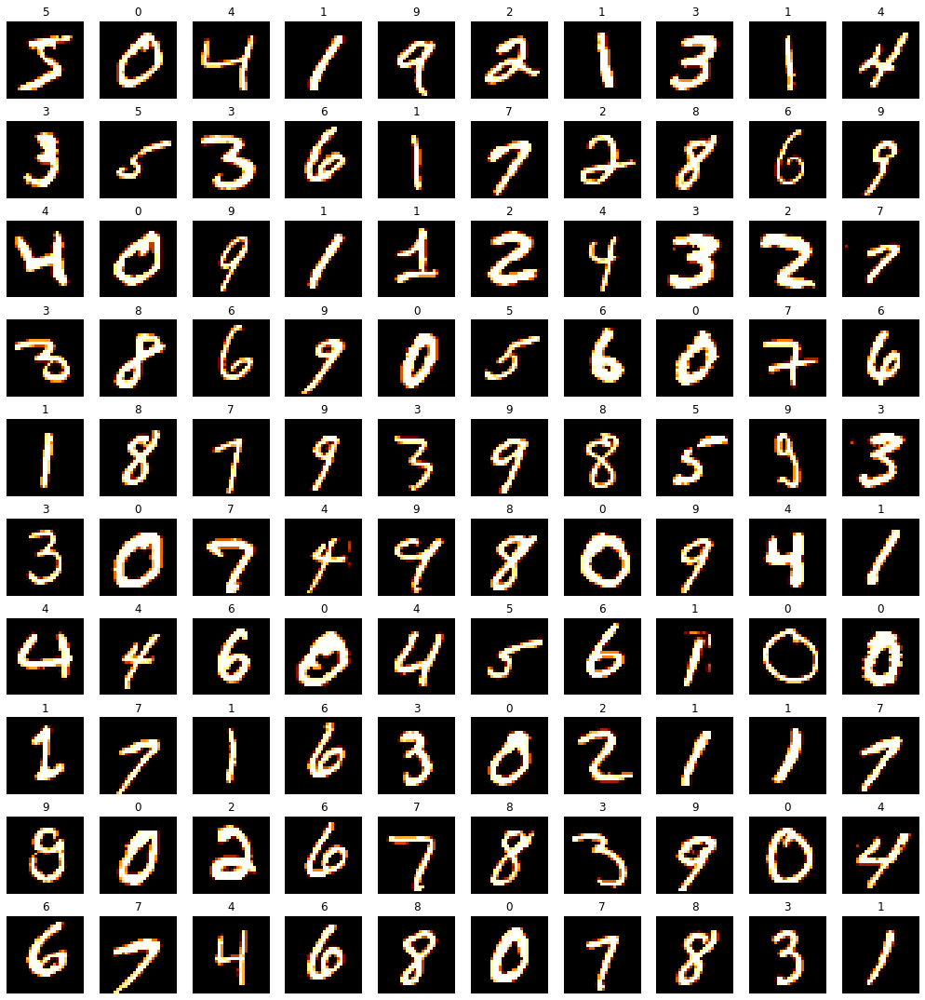

In [24]:
draw_digits(X, y, 100)

<div style="display: flex; background-color: indigo;" >

#### 2.5.2. Représentation graphique possible : via ACP ?
</div>

L'objectif est simplement d'être capable de réduire les données pour les représenter graphiquement

In [25]:
# ACP
pca = PCA(n_components=2)
acp_projection = pca.fit_transform(X_test)

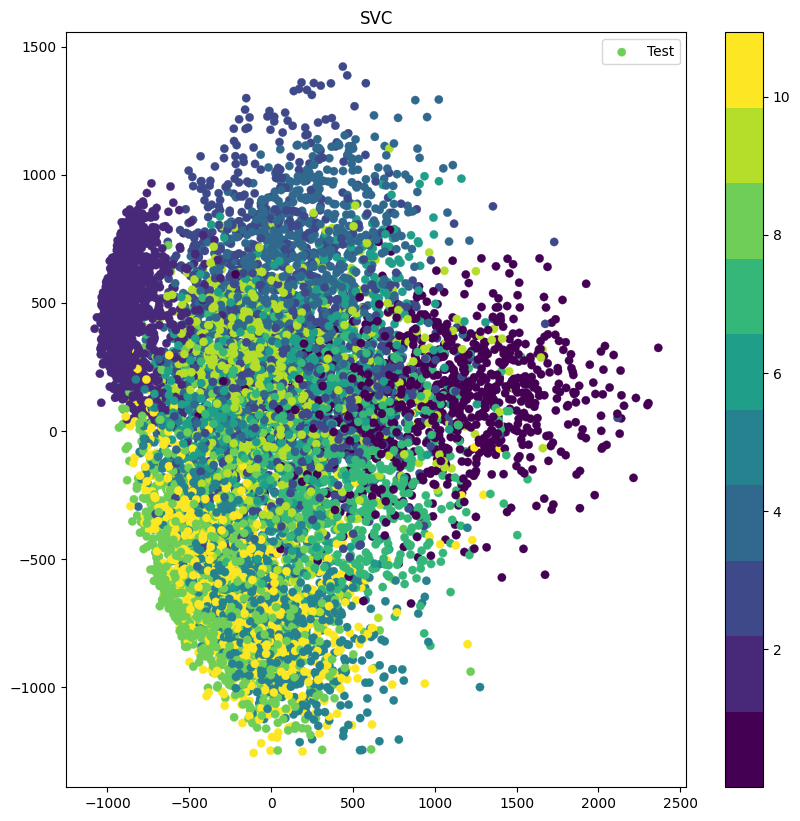

In [26]:
draw_predict(X_test, Y_test['class'], None, title="SVC", projection=acp_projection)

<div style="display: flex; background-color: indigo;" >

#### 2.5.3. Représentation graphique possible : via Isomap ?
</div>

L'objectif est simplement d'être capable de réduire les données pour les représenter graphiquement

In [27]:
from sklearn.manifold import Isomap

In [28]:
iso = Isomap(n_components=2)
projection = iso.fit_transform(X_test)

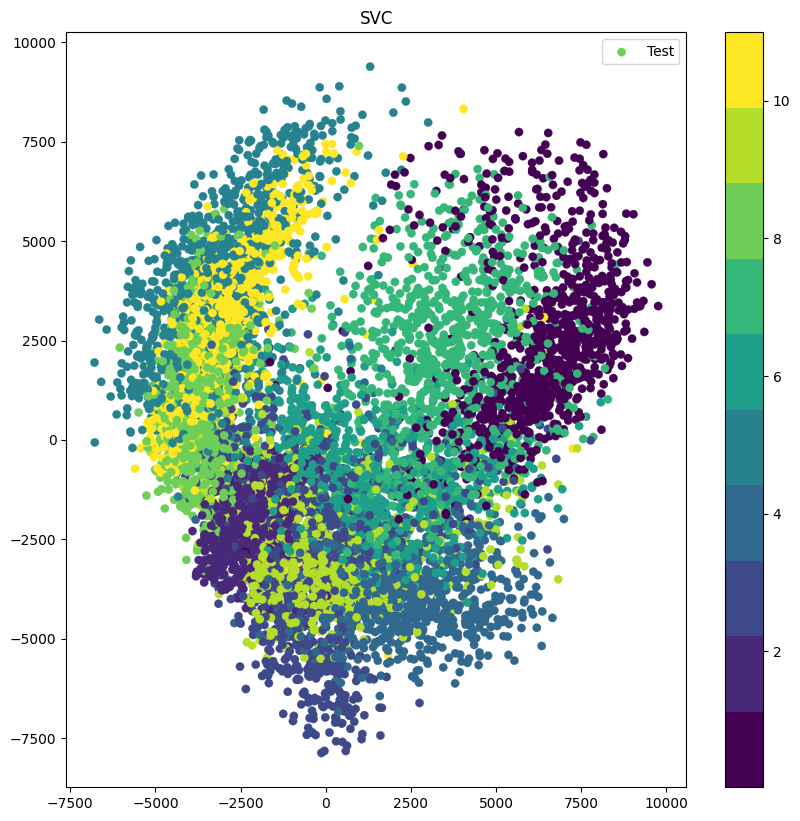

In [29]:
draw_predict(X_test, Y_test['class'], None, title="SVC", projection=projection)

<div style="display: flex; background-color: indigo;" >

#### 2.5.4. Représentation graphique possible : TSNE
</div>

L'objectif est simplement d'être capable de réduire les données pour les représenter graphiquement

In [30]:
#PCA
from sklearn.manifold import TSNE
tsne = TSNE(random_state = 42, n_components=2,verbose=0, perplexity=40, n_iter=300, init='random', learning_rate=200.0).fit_transform(X_train)

In [31]:
import seaborn as sns

In [32]:
df = pd.DataFrame()
df["y"] = Y_train["class"]
df["comp-1"] = tsne[:, 0]
df["comp-2"] = tsne[:, 1]
rows, cols = df.shape

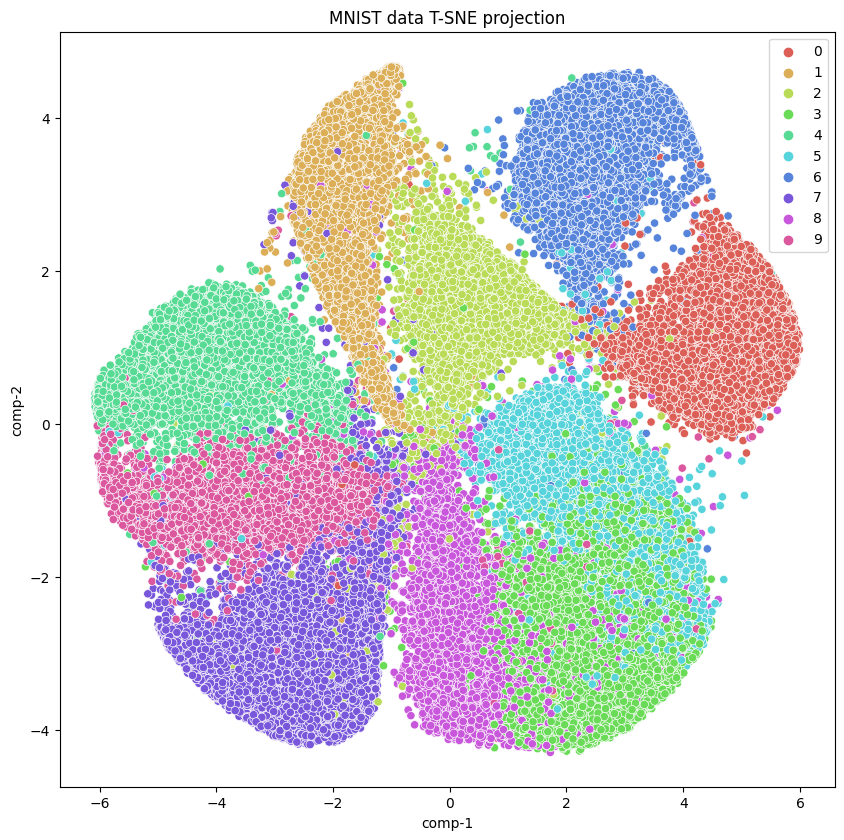

In [33]:
figure, axe = color_graph_background()
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MNIST data T-SNE projection")
figure.set_size_inches(10, 10, forward=True)
figure.set_dpi(100)

In [40]:
figure, axe = color_graph_background()

#fig, ax = plt.subplots(1, 2, figsize=figsize)
for i in range(df.shape[0]):
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color=plt.cm.Set1(df.iloc[i, 0] / 10.),
                fontdict={'weight': 'bold', 'size': 100})
axe.set_xticks([]), axe.set_yticks([])
# axe.legend()
figure.set_size_inches(10, 10, forward=True)
figure.set_dpi(100)

In [83]:
y_st = df["y"].astype("object")
y_st

0        5
1        0
2        4
3        1
4        9
        ..
59995    8
59996    3
59997    5
59998    6
59999    8
Name: y, Length: 60000, dtype: object

In [98]:
df.columns

Index(['y', 'comp-1', 'comp-2'], dtype='object')

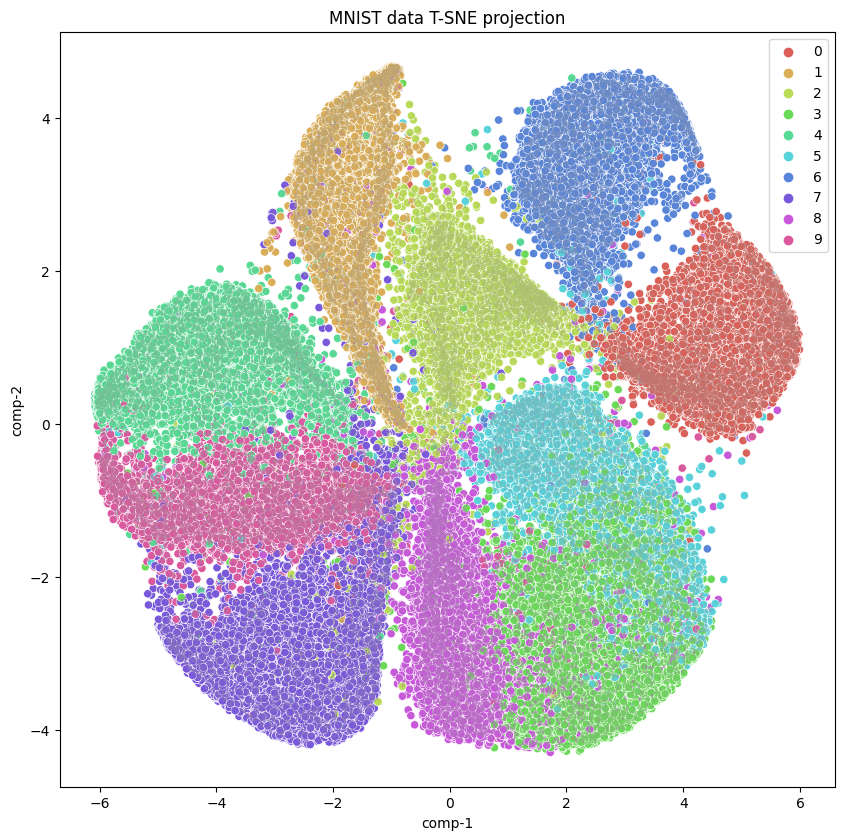

In [48]:
figure, axe = color_graph_background()
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MNIST data T-SNE projection")

for i in range(df.shape[0]):
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color=sns.color_palette("hls", 10, 0.6)[df.iloc[i, 0]],
                fontdict={'weight': 'bold', 'size': 2})

figure.set_size_inches(10, 10, forward=True)
figure.set_dpi(100)

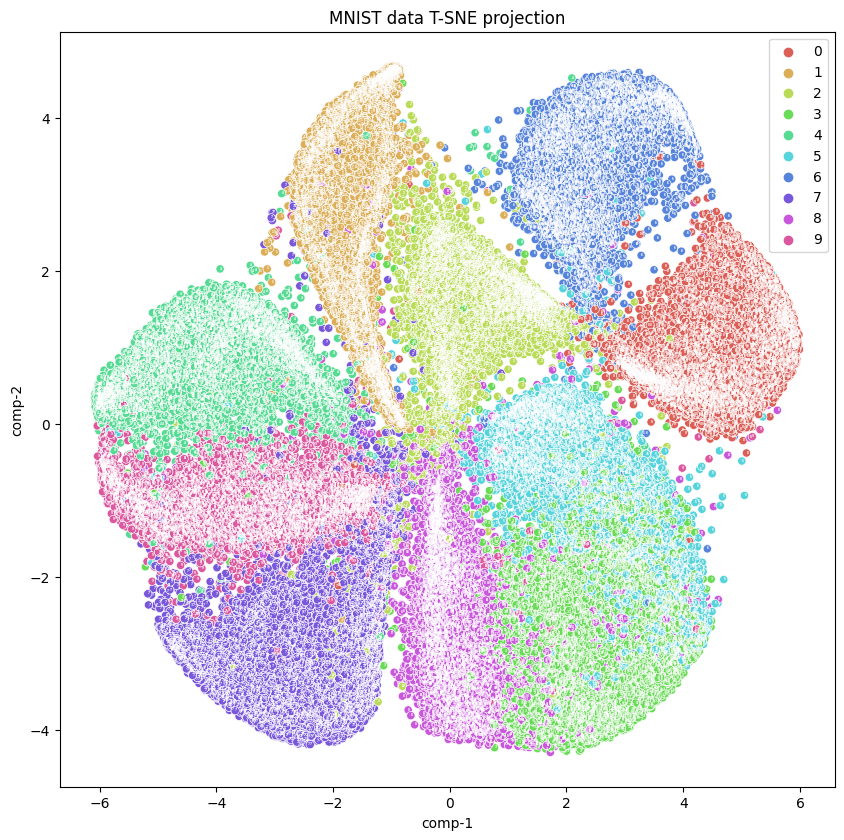

In [49]:
figure, axe = color_graph_background()
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MNIST data T-SNE projection")

for i in range(df.shape[0]):
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color="white",
                fontdict={'weight': 'bold', 'size': 2})

figure.set_size_inches(10, 10, forward=True)
figure.set_dpi(100)

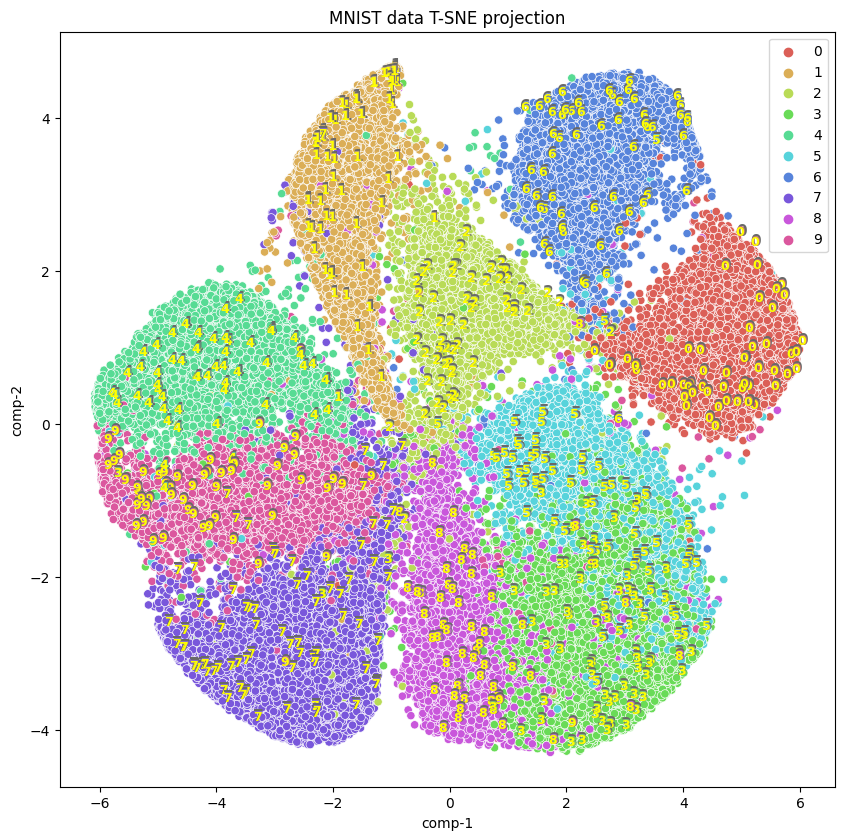

In [58]:
figure, axe = color_graph_background()
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df).set(title="MNIST data T-SNE projection")

for i in range(0, df.shape[0], 100):
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color="dimgray",
                fontdict={'weight': 'bold', 'size': 11})
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color=sns.color_palette("hls", 10, 0.6)[df.iloc[i, 0]],
                fontdict={'weight': 'bold', 'size': 10})
    axe.text(df.iloc[i, 1], df.iloc[i, 2], str(df.iloc[i, 0]),
                color="yellow",
                fontdict={'weight': 'bold', 'size': 9})

figure.set_size_inches(10, 10, forward=True)
figure.set_dpi(100)

<div style="display: flex; background-color: Blue; padding: 15px;" >

## Problème 1 : Classification binaire
</div>

Simplifions le problème pour l'instant et essayons seulement d'identifier un chiffre, par
exemple, le nombre 5. Ce "5-détecteur" sera un exemple d'un binaire
classificateur, capable de distinguer seulement deux classes, 5 et non-5.


* LogisticRegression
* KNN
* SVC

In [52]:
models_list = { }
Y_train.columns

Index(['class', 'class_0', 'class_1', 'class_2', 'class_3', 'class_4',
       'class_5', 'class_6', 'class_7', 'class_8', 'class_9'],
      dtype='object')

<div style="display: flex; background-color: Green; padding: 7px;" >

### 3.2. Test pour 1 chiffre
</div>

In [53]:
y_column_name='class_0'
random_state=0
verbose=0

In [54]:
def get_model_list(random_state=0, n_neighbors=3, verbose=0):
    model_list = {"Logistic":LogisticRegression(random_state=random_state, verbose=verbose),
                  "SVC OVO":svm.SVC(random_state=random_state, verbose=verbose),
                  "KNN":KNeighborsClassifier(n_neighbors=n_neighbors),
                  }
    return model_list

In [55]:
model_list = get_model_list(verbose=verbose)

In [56]:
modeldic, scores = fit_and_test_models(model_list, X_train, Y_train, X_test, Y_test, y_column_name=y_column_name, verbose=verbose, metrics=2)
score_df = pd.DataFrame(scores).set_index("Modeli")
score_df

,Class,Model,R2,fit time,fit seconde,metrics time,metrics seconde,predict time,predict seconde,MAE,...,Brier loss,Log loss,F1 micro,F1 macro,F1 weighted,Recall micro,Recall macro,Recall weighted,Roc auc ovo,Roc auc ovr
Modeli,,,,,,,,,,,,,,,,,,,,,
class_0-Logistic,class_0,Logistic,0.9922,00:00:04,4.682187,00:00:00,0.060736,00:00:00,0.014017,0.0078,...,0.006266,0.026424,0.9922,0.978080,0.992225,0.9922,0.981124,0.9922,0.981124,0.981124
class_0-SVC OVO,class_0,SVC OVO,0.9977,00:01:03,63.285574,00:00:07,7.800198,00:00:07,7.779208,0.0023,...,NaN,NaN,0.9977,0.993474,0.997696,0.9977,0.991903,0.9977,0.991903,0.991903
class_0-KNN,class_0,KNN,0.9970,00:00:11,11.719337,00:00:23,23.111537,00:00:11,11.574625,0.0030,...,0.002689,0.055363,0.9970,0.991584,0.997012,0.9970,0.995608,0.9970,0.995608,0.995608


<div style="display: flex; background-color: Green; padding: 7px;" >

### 3.3. Test pour tous les chiffres
</div>

In [57]:
# Pour éviter de déclencher la cellule ci-dessous car il est long,
# l'objectif étant toute fois de garder les traces de la dernière exécution
# just to fail

In [58]:
verbose=0
modeldic_full = {}

# ajout des données du modèle y_column_name
col_name_ever_done = False
if modeldic is not None:
    modeldic_full.update(modeldic)
    col_name_ever_done=True
if scores is None:
    scores = defaultdict(list)
    col_name_ever_done=True

for col in Y_train.columns:
    # pour éviter de refaire le traitement déjà réalisé sur un chiffre
    if col != 'class' and (col != y_column_name or not col_name_ever_done):
        if verbose:
            print(col)
        
        modeldic, scores = fit_and_test_models(get_model_list(verbose=verbose), X_train, Y_train, X_test, Y_test, y_column_name=col, scores=scores, verbose=verbose, metrics=2)
        modeldic_full.update(modeldic)
        if verbose:
            print("----------------------------")
score_all_class_df = pd.DataFrame(scores).set_index("Modeli")
score_all_class_df.round(decimals=3)
score_all_class_df

,Class,Model,R2,fit time,fit seconde,metrics time,metrics seconde,predict time,predict seconde,MAE,...,Brier loss,Log loss,F1 micro,F1 macro,F1 weighted,Recall micro,Recall macro,Recall weighted,Roc auc ovo,Roc auc ovr
Modeli,,,,,,,,,,,,,,,,,,,,,
class_0-Logistic,class_0,Logistic,0.9922,00:00:04,4.682187,00:00:00,0.060736,00:00:00,0.014017,0.0078,...,0.006266,0.026424,0.9922,0.978080,0.992225,0.9922,0.981124,0.9922,0.981124,0.981124
class_0-SVC OVO,class_0,SVC OVO,0.9977,00:01:03,63.285574,00:00:07,7.800198,00:00:07,7.779208,0.0023,...,NaN,NaN,0.9977,0.993474,0.997696,0.9977,0.991903,0.9977,0.991903,0.991903
class_0-KNN,class_0,KNN,0.9970,00:00:11,11.719337,00:00:23,23.111537,00:00:11,11.574625,0.0030,...,0.002689,0.055363,0.9970,0.991584,0.997012,0.9970,0.995608,0.9970,0.995608,0.995608
class_1-Logistic,class_1,Logistic,0.9933,00:00:04,4.415731,00:00:00,0.051495,00:00:00,0.012917,0.0067,...,0.005519,0.025184,0.9933,0.983435,0.993317,0.9933,0.985850,0.9933,0.985850,0.985850
class_1-SVC OVO,class_1,SVC OVO,0.9981,00:00:35,35.328653,00:00:05,5.436099,00:00:05,5.412973,0.0019,...,NaN,NaN,0.9981,0.995263,0.998097,0.9981,0.993551,0.9981,0.993551,0.993551
class_1-KNN,class_1,KNN,0.9959,00:00:11,11.617618,00:00:23,23.369344,00:00:11,11.702521,0.0041,...,0.003622,0.080183,0.9959,0.989948,0.995927,0.9959,0.996535,0.9959,0.996535,0.996535
class_2-Logistic,class_2,Logistic,0.9802,00:00:04,4.523515,00:00:00,0.049746,00:00:00,0.011748,0.0198,...,0.016763,0.079402,0.9802,0.944306,0.979789,0.9802,0.926793,0.9802,0.926793,0.926793
class_2-SVC OVO,class_2,SVC OVO,0.9947,00:02:16,136.491786,00:00:14,14.306669,00:00:14,14.285686,0.0053,...,NaN,NaN,0.9947,0.985515,0.994669,0.9947,0.979895,0.9947,0.979895,0.979895
class_2-KNN,class_2,KNN,0.9946,00:00:11,11.565320,00:00:23,23.934457,00:00:11,11.860215,0.0054,...,0.004489,0.088946,0.9946,0.985261,0.994572,0.9946,0.980268,0.9946,0.980268,0.980268


<div style="display: flex; background-color: Green; padding: 7px;" >

### 4.1. Test pour tous les chiffres ensemble
</div>

Test sans paramétrage particulier

In [59]:
verbose=0
y_column_name='class'

In [60]:
modeldic_all, scores = fit_and_test_models(get_model_list(verbose=verbose), X_train, Y_train, X_test, Y_test, y_column_name=y_column_name, scores=scores, verbose=verbose, metrics=2)
modeldic_full.update(modeldic_all)

score_all_class_df = pd.DataFrame(scores).set_index("Modeli")
score_all_class_df.round(decimals=3)
score_all_class_df

,Class,Model,R2,fit time,fit seconde,metrics time,metrics seconde,predict time,predict seconde,MAE,...,Brier loss,Log loss,F1 micro,F1 macro,F1 weighted,Recall micro,Recall macro,Recall weighted,Roc auc ovo,Roc auc ovr
Modeli,,,,,,,,,,,,,,,,,,,,,
class_0-Logistic,class_0,Logistic,0.9922,00:00:04,4.682187,00:00:00,0.060736,00:00:00,0.014017,0.0078,...,0.006266,0.026424,0.9922,0.978080,0.992225,0.9922,0.981124,0.9922,0.981124,0.981124
class_0-SVC OVO,class_0,SVC OVO,0.9977,00:01:03,63.285574,00:00:07,7.800198,00:00:07,7.779208,0.0023,...,NaN,NaN,0.9977,0.993474,0.997696,0.9977,0.991903,0.9977,0.991903,0.991903
class_0-KNN,class_0,KNN,0.9970,00:00:11,11.719337,00:00:23,23.111537,00:00:11,11.574625,0.0030,...,0.002689,0.055363,0.9970,0.991584,0.997012,0.9970,0.995608,0.9970,0.995608,0.995608
class_1-Logistic,class_1,Logistic,0.9933,00:00:04,4.415731,00:00:00,0.051495,00:00:00,0.012917,0.0067,...,0.005519,0.025184,0.9933,0.983435,0.993317,0.9933,0.985850,0.9933,0.985850,0.985850
class_1-SVC OVO,class_1,SVC OVO,0.9981,00:00:35,35.328653,00:00:05,5.436099,00:00:05,5.412973,0.0019,...,NaN,NaN,0.9981,0.995263,0.998097,0.9981,0.993551,0.9981,0.993551,0.993551
class_1-KNN,class_1,KNN,0.9959,00:00:11,11.617618,00:00:23,23.369344,00:00:11,11.702521,0.0041,...,0.003622,0.080183,0.9959,0.989948,0.995927,0.9959,0.996535,0.9959,0.996535,0.996535
class_2-Logistic,class_2,Logistic,0.9802,00:00:04,4.523515,00:00:00,0.049746,00:00:00,0.011748,0.0198,...,0.016763,0.079402,0.9802,0.944306,0.979789,0.9802,0.926793,0.9802,0.926793,0.926793
class_2-SVC OVO,class_2,SVC OVO,0.9947,00:02:16,136.491786,00:00:14,14.306669,00:00:14,14.285686,0.0053,...,NaN,NaN,0.9947,0.985515,0.994669,0.9947,0.979895,0.9947,0.979895,0.979895
class_2-KNN,class_2,KNN,0.9946,00:00:11,11.565320,00:00:23,23.934457,00:00:11,11.860215,0.0054,...,0.004489,0.088946,0.9946,0.985261,0.994572,0.9946,0.980268,0.9946,0.980268,0.980268


<div style="display: flex; background-color: indigo;" >

#### 4.2.2. R2 et temps d'exécution
</div>

In [61]:
score_all_class_df["Total use seconde"] = score_all_class_df["fit seconde"] + score_all_class_df["predict seconde"]

In [62]:
score_all_class_df["Total use seconde"].head()

Modeli
class_0-Logistic     4.696204
class_0-SVC OVO     71.064782
class_0-KNN         23.293962
class_1-Logistic     4.428648
class_1-SVC OVO     40.741626
Name: Total use seconde, dtype: float64

In [63]:
score_all_class_df["Total use time"] = score_all_class_df["Total use seconde"].apply(lambda x: time.strftime("%H:%M:%S", time.gmtime(x)))

In [64]:
best = score_all_class_df.sort_values(by=["R2", "Total use time"], ascending=False).drop_duplicates('Class', keep='first')

best[['Class', 'Model', 'R2', 'Total use time', 'metrics time',
       'MAE', 'MSE',  'RMSE', 'Mediane AE', 'Brier  loss', 'Log loss', 'F1 micro', 'F1 macro',
       'F1 weighted', 'Recall micro', 'Recall macro', 'Recall weighted',
       'Roc auc ovo', 'Roc auc ovr']]

,Class,Model,R2,Total use time,metrics time,MAE,MSE,RMSE,Mediane AE,Brier loss,Log loss,F1 micro,F1 macro,F1 weighted,Recall micro,Recall macro,Recall weighted,Roc auc ovo,Roc auc ovr
Modeli,,,,,,,,,,,,,,,,,,,
class_1-SVC OVO,class_1,SVC OVO,0.9981,00:00:40,00:00:05,0.0019,0.0019,0.043589,0.0,NaN,NaN,0.9981,0.995263,0.998097,0.9981,0.993551,0.9981,0.993551,0.993551
class_0-SVC OVO,class_0,SVC OVO,0.9977,00:01:11,00:00:07,0.0023,0.0023,0.047958,0.0,NaN,NaN,0.9977,0.993474,0.997696,0.9977,0.991903,0.9977,0.991903,0.991903
class_6-KNN,class_6,KNN,0.9970,00:00:23,00:00:23,0.0030,0.0030,0.054772,0.0,0.002589,0.045573,0.9970,0.991350,0.997001,0.9970,0.991808,0.9970,0.991808,0.991808
class_5-SVC OVO,class_5,SVC OVO,0.9956,00:02:50,00:00:16,0.0044,0.0044,0.066332,0.0,NaN,NaN,0.9956,0.986251,0.995566,0.9956,0.978876,0.9956,0.978876,0.978876
class_4-SVC OVO,class_4,SVC OVO,0.9954,00:01:58,00:00:13,0.0046,0.0046,0.067823,0.0,NaN,NaN,0.9954,0.986871,0.995375,0.9954,0.981569,0.9954,0.981569,0.981569
class_3-SVC OVO,class_3,SVC OVO,0.9953,00:03:07,00:00:16,0.0047,0.0047,0.068557,0.0,NaN,NaN,0.9953,0.986927,0.995276,0.9953,0.982006,0.9953,0.982006,0.982006
class_2-SVC OVO,class_2,SVC OVO,0.9947,00:02:30,00:00:14,0.0053,0.0053,0.072801,0.0,NaN,NaN,0.9947,0.985515,0.994669,0.9947,0.979895,0.9947,0.979895,0.979895
class_8-SVC OVO,class_8,SVC OVO,0.9937,00:03:25,00:00:19,0.0063,0.0063,0.079373,0.0,NaN,NaN,0.9937,0.981860,0.993660,0.9937,0.975902,0.9937,0.975902,0.975902
class_7-SVC OVO,class_7,SVC OVO,0.9929,00:01:31,00:00:12,0.0071,0.0071,0.084261,0.0,NaN,NaN,0.9929,0.980460,0.992845,0.9929,0.973219,0.9929,0.973219,0.973219


In [65]:
scores.keys()

dict_keys(['Class', 'Model', 'Modeli', 'R2', 'fit time', 'fit seconde', 'metrics time', 'metrics seconde', 'predict time', 'predict seconde', 'MAE', 'MSE', 'RMSE', 'Mediane AE', 'Brier  loss', 'Log loss', 'F1 micro', 'F1 macro', 'F1 weighted', 'Recall micro', 'Recall macro', 'Recall weighted', 'Roc auc ovo', 'Roc auc ovr'])

In [66]:
model_svc = modeldic_all[y_column_name+"-SVC OVO"]
model_knn = modeldic_all[y_column_name+"-KNN"]
model_logistic = modeldic_all[y_column_name+"-Logistic"]

A ce stade les scores sont déjà très bons.

In [67]:
y_predict_svc = model_svc.predict(X_test)

<Figure size 1296x1080 with 0 Axes>

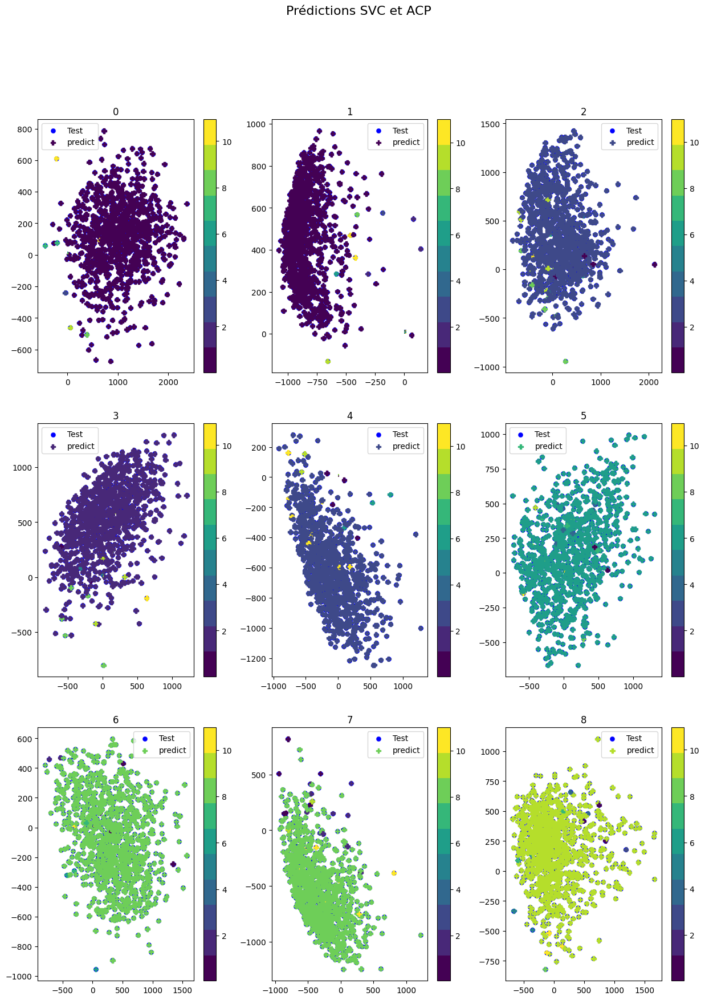

In [68]:
draw_all_predict(X_test, Y_test[y_column_name], y_predict_svc, title="Prédictions SVC et ACP", projection=acp_projection)

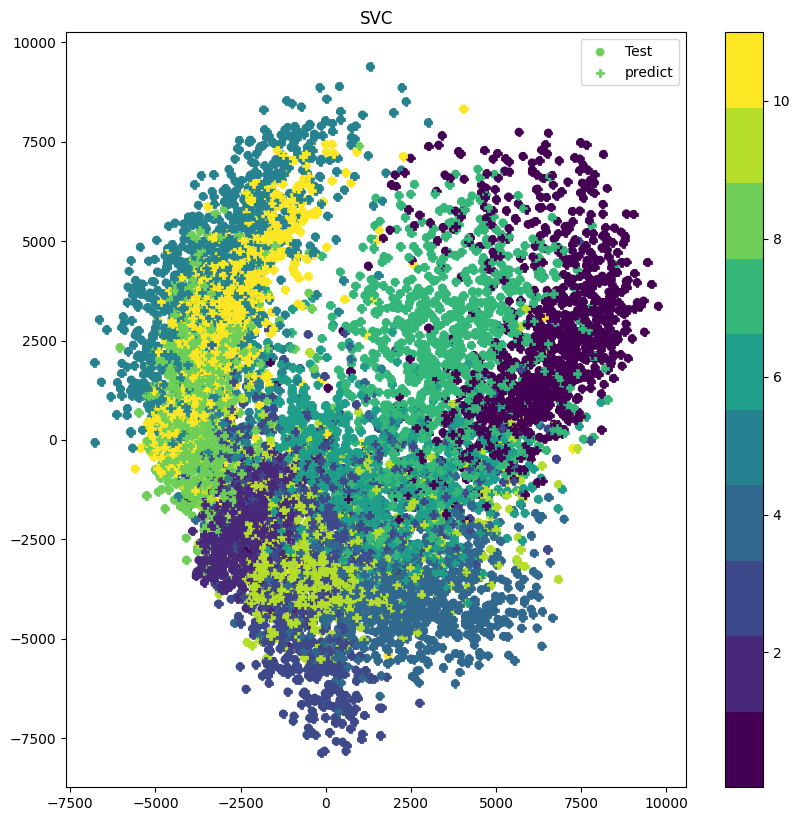

In [69]:
draw_predict(X_test, Y_test[y_column_name], y_predict_svc, title="SVC", projection=projection)

<Figure size 1296x1080 with 0 Axes>

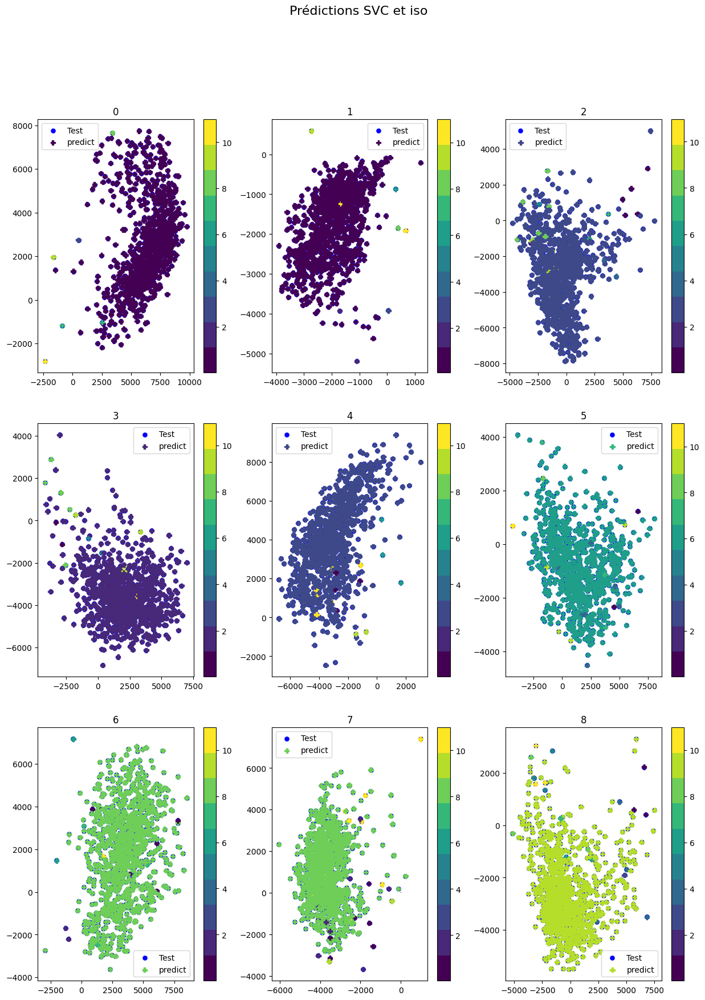

In [70]:
draw_all_predict(X_test, Y_test['class'], y_predict_svc, title="Prédictions SVC et iso", projection=projection)

In [71]:
y_predict_knn = model_knn.predict(X_test)

<div style="display: flex; background-color: indigo;" >

#### 4.1.2. Matrice de confusion
</div

In [72]:
predictions_dic = {"SVC":(model_svc, y_predict_svc), "KNN":(model_knn,y_predict_knn)}

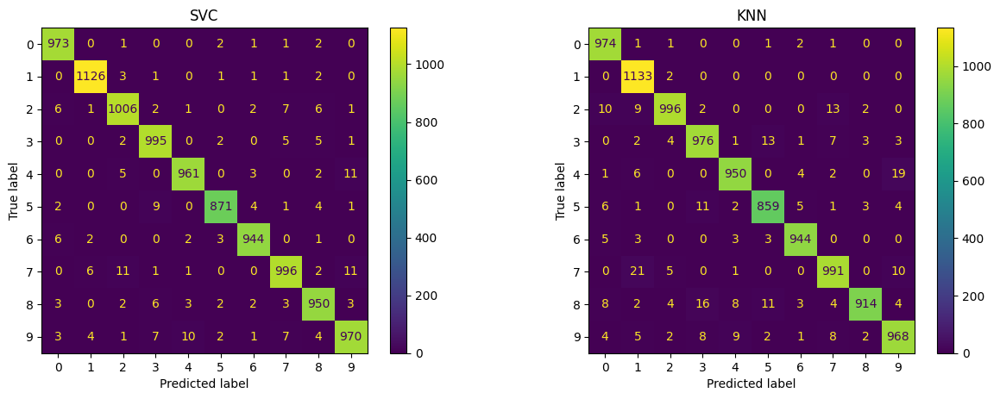

In [73]:
draw_confusion(Y_test[y_column_name], predictions_dic)

<div style="display: flex; background-color: indigo;" >

#### 4.1.4. PrecisionRecall et RocCurveDisplay
</div>

In [74]:
y_score = model_svc.decision_function(X_test)
y_score

array([[ 3.80895496, -0.30212376,  6.19343167, ...,  9.31783975,
         2.75699419,  7.28292338],
       [ 4.18553231,  4.18761078,  9.31442588, ..., -0.31459029,
         5.28430293,  1.69121956],
       [-0.30737409,  9.30985733,  7.22657291, ...,  8.27340301,
         6.2658673 ,  2.74423466],
       ...,
       [ 0.69383538, -0.30657546,  2.71090038, ...,  6.27292798,
         7.30014128,  8.3054091 ],
       [ 5.77650505,  2.74581705,  1.7213734 , ..., -0.29335033,
         8.30520036,  0.70817749],
       [ 6.20908778, -0.30250671,  8.29122329, ...,  0.69621888,
         3.75120338,  2.72899814]])